In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from scipy.linalg import svd
from itertools import combinations
import torch
import argparse

torch.serialization.add_safe_globals([argparse.Namespace])
from lightning.pytorch import LightningModule
from SAE import SAE
import lightning.pytorch as pl
import torch
import torch.nn as nn
import torch.nn.functional as F

загрузка данных

In [2]:
names_noort = pd.read_csv("concept_names_noort.csv", header=None)[1].tolist()
names_ortsae = pd.read_csv("concept_names_ortsae.csv", header=None)[1].tolist()
names_srip = pd.read_csv("concept_names_srip.csv", header=None)[1].tolist()
names_frob = pd.read_csv("concept_names_frob.csv", header=None)[1].tolist()

names_no_norm_frob = pd.read_csv("concept_names_no_norm_frob.csv", header=None)[1].tolist()
names_no_norm_noort = pd.read_csv("concept_names_no_norm_noort.csv", header=None)[1].tolist()
names_no_norm_ortsae = pd.read_csv("concept_names_no_norm_ortsae.csv", header=None)[1].tolist()
names_no_norm_srip = pd.read_csv("concept_names_no_norm_srip.csv", header=None)[1].tolist()

names_sim_frob = pd.read_csv("concept_names_frob_sim.csv", header=None)[1].tolist()
names_sim_noort = pd.read_csv("concept_names_noort_sim.csv", header=None)[1].tolist()
names_sim_ortsae = pd.read_csv("concept_names_ortsae_sim.csv", header=None)[1].tolist()
names_sim_srip = pd.read_csv("concept_names_srip_sim.csv", header=None)[1].tolist()

ckpt_paths = {
    "frob":   "sae_final_frobenius_5e-7-epoch=175.ckpt",
    "ortsae": "sae_ortsae_l1e-6-epoch=199.ckpt",
    "noort":  "sae_scheduler_noort_l11e-7-epoch=199.ckpt",
    "srip":   "sae_srip_l1e-7_lr1e-4-epoch=195.ckpt",
}
def load_decoder_weight(ckpt_path):
    ckpt = torch.load(
        ckpt_path,
        map_location=torch.device("cpu"),
    )
    W = ckpt["state_dict"]["decoder.weight"]
    return W

dict_usual = {
    key: [names, load_decoder_weight(ckpt_paths[key])]
    for key, names in {
        "frob": names_frob,
        "ortsae": names_ortsae,
        "noort": names_noort,
        "srip": names_srip,
    }.items()
}

dict_no_norm = {
    key: [names, load_decoder_weight(ckpt_paths[key])]
    for key, names in {
        "frob": names_no_norm_frob,
        "ortsae": names_no_norm_ortsae,
        "noort": names_no_norm_noort,
        "srip": names_no_norm_srip,
    }.items()
}
dict_sim = {
    key: [names, load_decoder_weight(ckpt_paths[key])]
    for key, names in {
        "frob": names_sim_frob,
        "ortsae": names_sim_ortsae,
        "noort": names_sim_noort,
        "srip": names_sim_srip,
    }.items()
}


In [45]:
dict_no_norm['frob'][-1].shape

torch.Size([1024, 4096])

cosine_similarity_stats_dict_with_std_log_table

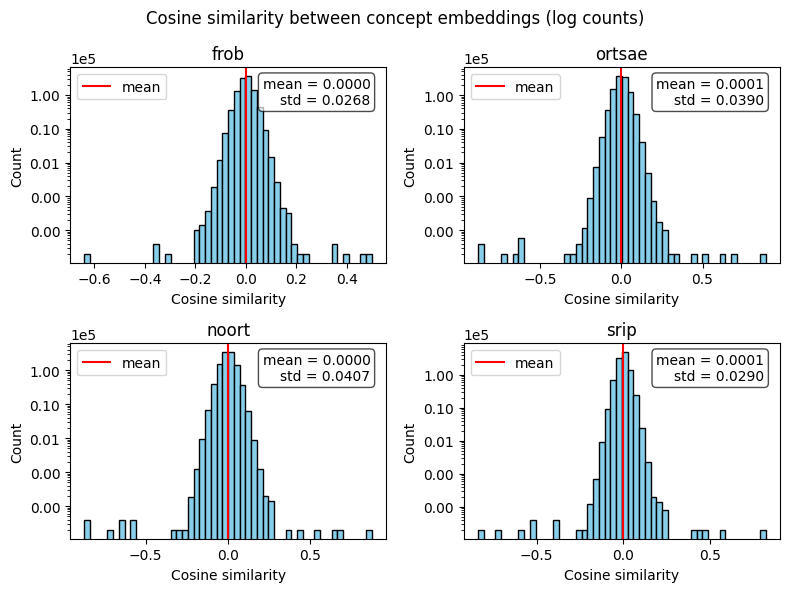


=== Cosine similarity statistics ===

[frob]
mean=0.0000, std=0.0268, min=-0.6395, max=0.5002

[ortsae]
mean=0.0001, std=0.0390, min=-0.8823, max=0.8884

[noort]
mean=0.0000, std=0.0407, min=-0.8706, max=0.8722

[srip]
mean=0.0001, std=0.0290, min=-0.8370, max=0.8226


In [99]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import LogLocator, ScalarFormatter

def cosine_similarity_stats_dict_with_std_log_table(dict_sim, bins=50):
    """
    dict_sim: {
        "sim_name": [names, E],
        ...
    }
    E: [n_concepts, d]
    """
    def to_numpy(E):
        return E.detach().cpu().numpy() if hasattr(E, "detach") else E

    fig, axes = plt.subplots(2, 2, figsize=(8, 6))
    axes = axes.flatten()

    stats = {}

    for ax, (key, (_, E)) in zip(axes, dict_sim.items()):
        E_np = to_numpy(E)

        # нормализация
        norms = np.linalg.norm(E_np, axis=1, keepdims=True)
        E_norm = E_np / norms

        # cosine similarity matrix
        G = E_norm @ E_norm.T

        # убираем диагональ
        mask = ~np.eye(G.shape[0], dtype=bool)
        cos_vals = G[mask]

        # histogram
        counts, bins_edges, _ = ax.hist(cos_vals, bins=bins, edgecolor="k", color='skyblue')
        ax.set_title(key)
        ax.set_xlabel("Cosine similarity")
        ax.set_ylabel("Count")

        # логарифмическая ось Y
        ax.set_yscale('log')
        ax.yaxis.set_major_locator(LogLocator(base=10.0))
        ax.yaxis.set_major_formatter(ScalarFormatter())
        ax.ticklabel_format(axis='y', style='sci', scilimits=(0,0))

        # статистика
        mean = cos_vals.mean()
        std = cos_vals.std()
        stats[key] = {
            "mean": mean,
            "std": std,
            "min": cos_vals.min(),
            "max": cos_vals.max(),
        }

        # линия для среднего
        ax.axvline(mean, color='red', linestyle='-', label='mean')
        ax.legend()

        # табличка с mean и std в правом верхнем углу
        table_text = f"mean = {mean:.4f}\nstd = {std:.4f}"
        ax.text(
            0.95, 0.95, table_text,
            transform=ax.transAxes,
            fontsize=10,
            verticalalignment='top',
            horizontalalignment='right',
            bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.7)
        )

    plt.suptitle("Cosine similarity between concept embeddings (log counts)")
    plt.tight_layout()
    plt.show()

    # печать статистики
    print("\n=== Cosine similarity statistics ===")
    for key, s in stats.items():
        print(f"\n[{key}]")
        print(
            f"mean={s['mean']:.4f}, "
            f"std={s['std']:.4f}, "
            f"min={s['min']:.4f}, "
            f"max={s['max']:.4f}"
        )

# запуск
cosine_similarity_stats_dict_with_std_log_table(dict_usual)


In [79]:
import numpy as np
from scipy.stats import ttest_1samp, f

def cosine_similarity_tests(dict_sim):
    results_mean = {}
    results_var = {}

    # берем noort для сравнения дисперсий
    _, E_noort = dict_sim['noort']
    E_noort = E_noort.detach().cpu().numpy() if hasattr(E_noort, "detach") else E_noort
    E_noort_norm = E_noort / np.linalg.norm(E_noort, axis=1, keepdims=True)
    G_noort = E_noort_norm @ E_noort_norm.T
    mask_noort = ~np.eye(G_noort.shape[0], dtype=bool)
    cos_noort = G_noort[mask_noort]
    var_noort = np.var(cos_noort, ddof=1)

    for key, (_, E) in dict_sim.items():
        E_np = E.detach().cpu().numpy() if hasattr(E, "detach") else E
        E_norm = E_np / np.linalg.norm(E_np, axis=1, keepdims=True)
        G = E_norm @ E_norm.T
        mask = ~np.eye(G.shape[0], dtype=bool)
        cos_vals = G[mask]

        # t-тест для проверки, что среднее ~ 0
        t_stat, p_val = ttest_1samp(cos_vals, 0)
        results_mean[key] = (t_stat, p_val)

        # F-тест для сравнения дисперсии с noort (H1: var < var_noort)
        var1 = np.var(cos_vals, ddof=1)
        F_stat = var1 / var_noort
        df1 = len(cos_vals) - 1
        df2 = len(cos_noort) - 1
        p_val_var = f.cdf(F_stat, df1, df2)  # проверяем меньше ли
        results_var[key] = (F_stat, p_val_var)

    # вывод результатов
    print("=== T-tests (mean ~ 0) ===")
    for key, (t_stat, p_val) in results_mean.items():
        print(f"{key}: t={t_stat:.4f}, p={p_val:.4e}")

    print("\n=== F-tests (variance < noort) ===")
    for key, (F_stat, p_val) in results_var.items():
        print(f"{key}: F={F_stat:.4f}, p={p_val:.4e}")

    return results_mean, results_var

# запуск
results_mean, results_var = cosine_similarity_tests(dict_usual)


=== T-tests (mean ~ 0) ===
frob: t=1.7726, p=7.6288e-02
ortsae: t=1.8518, p=6.4051e-02
noort: t=1.2405, p=2.1478e-01
srip: t=1.8572, p=6.3285e-02

=== F-tests (variance < noort) ===
frob: F=0.4349, p=0.0000e+00
ortsae: F=0.9201, p=0.0000e+00
noort: F=1.0000, p=5.0000e-01
srip: F=0.5068, p=0.0000e+00


In [11]:
import numpy as np
import matplotlib.pyplot as plt

def max_cosine_per_concept_dict(dict_sim, bins=50):
    """
    dict_sim: {
        "sim_name": [names, E],
        ...
    }
    E: [n_concepts, d]
    """

    def to_numpy(E):
        return E.detach().cpu().numpy() if hasattr(E, "detach") else E

    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    axes = axes.flatten()

    stats = {}

    for ax, (key, (_, E)) in zip(axes, dict_sim.items()):
        E_np = to_numpy(E)

        # normalize embeddings
        norms = np.linalg.norm(E_np, axis=1, keepdims=True)
        E_norm = E_np / norms

        # Gram matrix (cosine similarity)
        G = E_norm @ E_norm.T

        # kill diagonal
        np.fill_diagonal(G, -1.0)

        # max cosine per concept
        max_cos = G.max(axis=1)

        # histogram
        ax.hist(max_cos, bins=bins, edgecolor="k")
        ax.set_title(key)
        ax.set_xlabel("max cosine similarity to other concept")
        ax.set_ylabel("count")

        stats[key] = {
            "mean": max_cos.mean(),
            "std": max_cos.std(),
            "min": max_cos.min(),
            "max": max_cos.max(),
        }

    plt.suptitle("Max cosine similarity per concept")
    plt.tight_layout()
    plt.show()

    # print stats
    print("\n=== Max cosine similarity statistics ===")
    for key, s in stats.items():
        print(f"\n[{key}]")
        print(
            f"mean={s['mean']:.4f}, "
            f"std={s['std']:.4f}, "
            f"min={s['min']:.4f}, "
            f"max={s['max']:.4f}"
        )


In [88]:
from scipy.stats import ttest_1samp, f

def max_cosine_stats_tests(dict_sim):
    results_mean = {}
    results_var = {}

    # берем noort для F-теста
    _, E_noort = dict_sim['noort']
    E_noort = E_noort.detach().cpu().numpy() if hasattr(E_noort, "detach") else E_noort
    E_noort_norm = E_noort / np.linalg.norm(E_noort, axis=1, keepdims=True)
    G_noort = E_noort_norm @ E_noort_norm.T
    np.fill_diagonal(G_noort, -1.0)
    cos_noort = G_noort.max(axis=1)
    var_noort = np.var(cos_noort, ddof=1)

    for key, (_, E) in dict_sim.items():
        E_np = E.detach().cpu().numpy() if hasattr(E, "detach") else E
        E_norm = E_np / np.linalg.norm(E_np, axis=1, keepdims=True)
        G = E_norm @ E_norm.T
        np.fill_diagonal(G, -1.0)
        max_cos = G.max(axis=1)

        # t-test: mean ~ 0
        t_stat, p_val = ttest_1samp(max_cos, 0)
        results_mean[key] = (t_stat, p_val)

        # F-test: variance < noort
        var1 = np.var(max_cos, ddof=1)
        F_stat = var1 / var_noort
        df1 = len(max_cos) - 1
        df2 = len(cos_noort) - 1
        p_val_var = f.cdf(F_stat, df1, df2)
        results_var[key] = (F_stat, p_val_var)

    print("=== T-tests (mean ~ 0) ===")
    for key, (t_stat, p_val) in results_mean.items():
        print(f"{key}: t={t_stat:.4f}, p={p_val:.4e}")

    print("\n=== F-tests (variance < noort) ===")
    for key, (F_stat, p_val) in results_var.items():
        print(f"{key}: F={F_stat:.4f}, p={p_val:.4e}")

    return results_mean, results_var

# запуск тестов
results_mean, results_var = max_cosine_stats_tests(dict_usual)


=== T-tests (mean ~ 0) ===
frob: t=78.3445, p=0.0000e+00
ortsae: t=82.1667, p=0.0000e+00
noort: t=86.4039, p=0.0000e+00
srip: t=70.0343, p=0.0000e+00

=== F-tests (variance < noort) ===
frob: F=0.5383, p=4.4207e-23
ortsae: F=1.0255, p=6.5632e-01
noort: F=1.0000, p=5.0000e-01
srip: F=0.8363, p=2.1482e-03


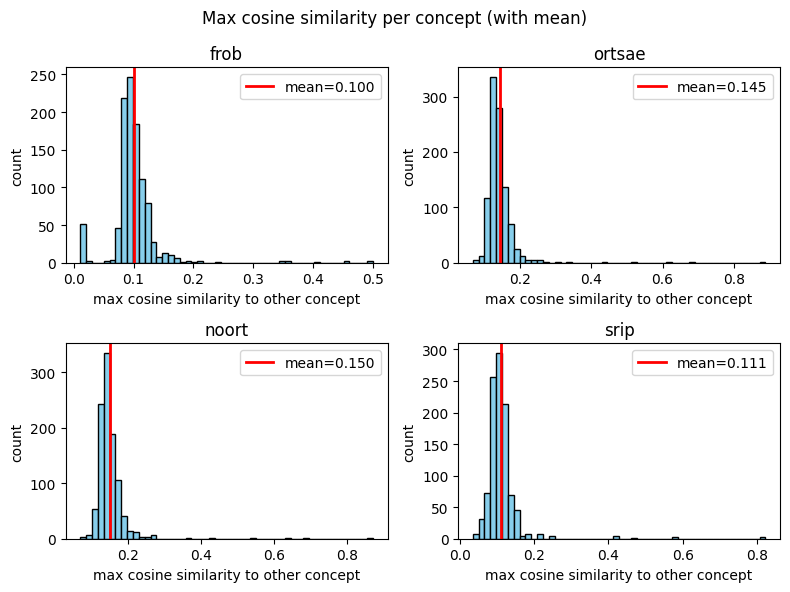


=== Max cosine similarity statistics ===

[frob]
mean=0.1000, std=0.0408, min=0.0109, max=0.5002

[ortsae]
mean=0.1448, std=0.0563, min=0.0676, max=0.8884

[noort]
mean=0.1503, std=0.0556, min=0.0674, max=0.8722

[srip]
mean=0.1114, std=0.0509, min=0.0346, max=0.8226


In [95]:
import numpy as np
import matplotlib.pyplot as plt

def max_cosine_per_concept_with_mean(dict_sim, bins=50):
    """
    dict_sim: {
        "sim_name": [names, E],
        ...
    }
    E: [n_concepts, d]
    """
    def to_numpy(E):
        return E.detach().cpu().numpy() if hasattr(E, "detach") else E

    fig, axes = plt.subplots(2, 2, figsize=(8, 6))
    axes = axes.flatten()

    stats = {}

    for ax, (key, (_, E)) in zip(axes, dict_sim.items()):
        E_np = to_numpy(E)

        # normalize embeddings
        norms = np.linalg.norm(E_np, axis=1, keepdims=True)
        E_norm = E_np / norms

        # Gram matrix
        G = E_norm @ E_norm.T
        np.fill_diagonal(G, -1.0)

        # max cosine per concept
        max_cos = G.max(axis=1)

        # histogram
        ax.hist(max_cos, bins=bins, edgecolor="k", color='skyblue')
        ax.set_title(key)
        ax.set_xlabel("max cosine similarity to other concept")
        ax.set_ylabel("count")

        # добавить красную линию для среднего
        mean_val = max_cos.mean()
        ax.axvline(mean_val, color='red', linestyle='-', linewidth=2, label=f'mean={mean_val:.3f}')
        ax.legend()

        # сохранить статистику
        stats[key] = {
            "mean": mean_val,
            "std": max_cos.std(),
            "min": max_cos.min(),
            "max": max_cos.max(),
        }

    plt.suptitle("Max cosine similarity per concept (with mean)")
    plt.tight_layout()
    plt.show()

    # печать статистики
    print("\n=== Max cosine similarity statistics ===")
    for key, s in stats.items():
        print(f"\n[{key}]")
        print(
            f"mean={s['mean']:.4f}, "
            f"std={s['std']:.4f}, "
            f"min={s['min']:.4f}, "
            f"max={s['max']:.4f}"
        )

# запуск
max_cosine_per_concept_with_mean(dict_usual)


In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import svd


def spectral_analysis_dict(
    dict_sim,
    energy_level=0.95,
    rel_threshold=0.1,
    bins=50,
    eps=1e-12,
):
    """
    dict_sim: {
        "sim_name": [names, W],
        ...
    }

    energy_level: доля энергии для k_energy
    rel_threshold: σ > rel_threshold * σ_max
    eps: порог для "нулевых" сингулярных значений
    """

    def to_numpy(W):
        return W.detach().cpu().numpy() if hasattr(W, "detach") else W

    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    axes = axes.flatten()

    stats = {}

    for ax, (key, (_, W)) in zip(axes, dict_sim.items()):
        W_np = to_numpy(W)

        # SVD
        _, S, _ = svd(W_np, full_matrices=False)

        # ---------- histogram ----------
        ax.hist(S, bins=bins, edgecolor="k")
        ax.set_title(key)
        ax.set_xlabel("Singular value")
        ax.set_ylabel("Count")

        # ---------- energy rank ----------
        energy = np.cumsum(S**2) / np.sum(S**2)
        k_energy = np.searchsorted(energy, energy_level) + 1

        # ---------- threshold rank ----------
        k_thresh = np.sum(S > rel_threshold * S.max())

        # ---------- entropy effective rank ----------
        p = S**2 / np.sum(S**2)
        eff_rank_entropy = np.exp(-np.sum(p * np.log(p + eps)))

        # ---------- condition number ----------
        nonzero = S[S > eps]
        if len(nonzero) == 0:
            cond = np.inf
        else:
            cond = nonzero.max() / nonzero.min()

        stats[key] = {
            "rank_energy": k_energy,
            "rank_thresh": k_thresh,
            "eff_rank_entropy": eff_rank_entropy,
            "condition_number": cond,
            "sv_min": S.min(),
            "sv_max": S.max(),
        }

    plt.suptitle("Singular value distributions")
    plt.tight_layout()
    plt.show()

    # ---------- print ----------
    print("\n=== Spectral & conditioning statistics ===")
    print(f"Energy level = {energy_level}, rel_threshold = {rel_threshold}\n")

    for key, s in stats.items():
        print(f"[{key}]")
        print(
            f"  k_energy ({int(energy_level*100)}%): {s['rank_energy']}\n"
            f"  k_thresh (σ > {rel_threshold}·σ_max): {s['rank_thresh']}\n"
            f"  entropy eff. rank: {s['eff_rank_entropy']:.2f}\n"
            f"  condition number κ₂: {s['condition_number']:.3e}\n"
            f"  σ_min={s['sv_min']:.3e}, σ_max={s['sv_max']:.3e}\n"
        )


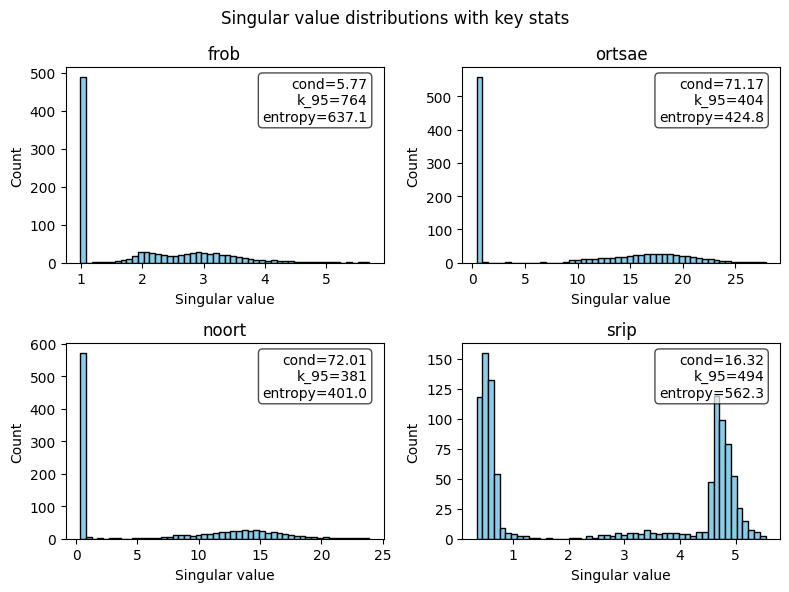


=== Spectral & conditioning statistics ===

[frob]
  k_energy (95%): 764
  entropy eff. rank: 637.10
  condition number κ₂: 5.77
  σ_min=9.867e-01, σ_max=5.697e+00

[ortsae]
  k_energy (95%): 404
  entropy eff. rank: 424.80
  condition number κ₂: 71.17
  σ_min=3.914e-01, σ_max=2.786e+01

[noort]
  k_energy (95%): 381
  entropy eff. rank: 400.96
  condition number κ₂: 72.01
  σ_min=3.318e-01, σ_max=2.389e+01

[srip]
  k_energy (95%): 494
  entropy eff. rank: 562.26
  condition number κ₂: 16.32
  σ_min=3.394e-01, σ_max=5.540e+00



In [94]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import svd

def spectral_analysis_with_corner_stats(dict_sim, energy_level=0.95, bins=50, eps=1e-12):
    """
    Анализ спектра матрицы эмбеддингов с гистограммой и статистикой в углу.
    """
    def to_numpy(W):
        return W.detach().cpu().numpy() if hasattr(W, "detach") else W

    fig, axes = plt.subplots(2, 2, figsize=(8, 6))
    axes = axes.flatten()

    stats = {}

    for ax, (key, (_, W)) in zip(axes, dict_sim.items()):
        W_np = to_numpy(W)

        # SVD
        _, S, _ = svd(W_np, full_matrices=False)

        # histogram
        ax.hist(S, bins=bins, edgecolor="k", color='skyblue')
        ax.set_title(key)
        ax.set_xlabel("Singular value")
        ax.set_ylabel("Count")

        # ---------- energy rank ----------
        energy = np.cumsum(S**2) / np.sum(S**2)
        k_energy = np.searchsorted(energy, energy_level) + 1

        # ---------- entropy effective rank ----------
        p = S**2 / np.sum(S**2)
        eff_rank_entropy = np.exp(-np.sum(p * np.log(p + eps)))

        # ---------- condition number ----------
        nonzero = S[S > eps]
        cond = nonzero.max() / nonzero.min() if len(nonzero) > 0 else np.inf

        # текст в правом верхнем углу
        stats_text = (
            f"cond={cond:.2f}\n"
            f"k_95={k_energy}\n"
            f"entropy={eff_rank_entropy:.1f}"
        )
        ax.text(
            0.95, 0.95, stats_text,
            transform=ax.transAxes,
            fontsize=10,
            verticalalignment='top',
            horizontalalignment='right',
            bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.7)
        )

        stats[key] = {
            "rank_energy": k_energy,
            "eff_rank_entropy": eff_rank_entropy,
            "condition_number": cond,
            "sv_min": S.min(),
            "sv_max": S.max(),
        }

    plt.suptitle("Singular value distributions with key stats")
    plt.tight_layout()
    plt.show()

    # печать статистики
    print("\n=== Spectral & conditioning statistics ===\n")
    for key, s in stats.items():
        print(f"[{key}]")
        print(
            f"  k_energy (95%): {s['rank_energy']}\n"
            f"  entropy eff. rank: {s['eff_rank_entropy']:.2f}\n"
            f"  condition number κ₂: {s['condition_number']:.2f}\n"
            f"  σ_min={s['sv_min']:.3e}, σ_max={s['sv_max']:.3e}\n"
        )

# запуск
spectral_analysis_with_corner_stats(dict_usual)


In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import svd


def explained_variance_analysis_dict(
    dict_sim,
    levels=(0.9, 0.95),
):
    """
    dict_sim: {
        "sim_name": [names, W],
        ...
    }

    W: [dim, n_concepts]
    """

    def to_numpy(W):
        return W.detach().cpu().numpy() if hasattr(W, "detach") else W

    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    axes = axes.flatten()

    stats = {}

    for ax, (key, (_, W)) in zip(axes, dict_sim.items()):
        W_np = to_numpy(W)

        # SVD
        _, S, _ = svd(W_np, full_matrices=False)

        # cumulative explained variance
        energy = np.cumsum(S**2) / np.sum(S**2)

        ax.plot(energy, marker='o')
        ax.set_title(key)
        ax.set_xlabel("Number of singular values")
        ax.set_ylabel("Cumulative explained variance")
        ax.grid(True)

        # ranks for given levels
        ranks = {
            f"k_{int(lvl*100)}": np.searchsorted(energy, lvl) + 1
            for lvl in levels
        }

        stats[key] = ranks

        # draw horizontal lines
        for lvl in levels:
            ax.axhline(lvl, linestyle="--", alpha=0.6)

    plt.suptitle("Cumulative explained variance")
    plt.tight_layout()
    plt.show()

    # -------- print stats --------
    print("\n=== Explained variance ranks ===\n")
    for key, s in stats.items():
        print(f"[{key}]")
        for name, val in s.items():
            print(f"  {name}: {val}")
        print()


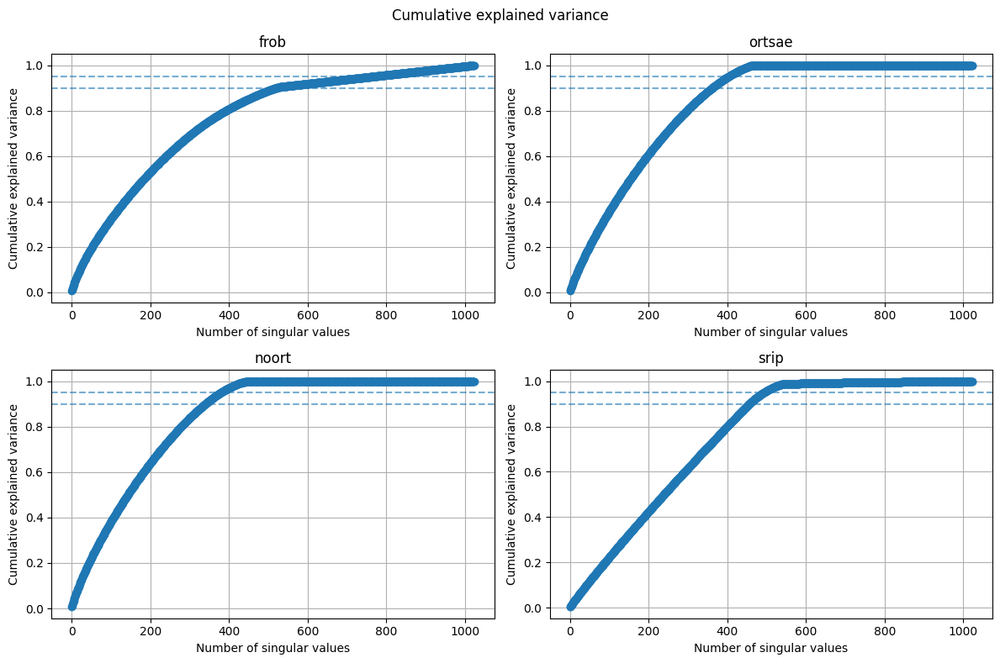


=== Explained variance ranks ===

[frob]
  k_90: 521
  k_95: 764

[ortsae]
  k_90: 363
  k_95: 404

[noort]
  k_90: 341
  k_95: 381

[srip]
  k_90: 457
  k_95: 494



In [20]:
explained_variance_analysis_dict(dict_usual, levels=(0.9, 0.95))

In [8]:
import numpy as np
import pandas as pd
import torch
from collections import defaultdict
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
import umap
import plotly.express as px
import matplotlib.pyplot as plt
import os

def average_by_name(embeddings, names):
    groups = defaultdict(list)
    for i, name in enumerate(names):
        groups[name].append(i)
    avg_embeds = []
    avg_names = []
    for name, idxs in groups.items():
        vec = embeddings[:, idxs].mean(axis=1)
        avg_embeds.append(vec)
        avg_names.append(name)
    return np.stack(avg_embeds, axis=1), avg_names

def visualize_concept_embeddings_full(
    dict_sim,
    distance_threshold=0.3,  # для косинуса обычно 0.1-0.3
    random_state=42,
    linkage_method='ward',    # 'ward', 'average', 'complete'
    metric='euclidean',       # 'euclidean' для ward, 'cosine' для косинусного
    save_dir='cluster_results'
):
    os.makedirs(save_dir, exist_ok=True)
    results = {}

    for key, (names, W) in dict_sim.items():
        print(f"\n=== Processing {key} ===")
        if len(names) != W.shape[1]:
            raise ValueError(f"For model {key}: length of names ({len(names)}) "
                             f"does not match number of embeddings ({W.shape[1]})")

        # --- Усреднение по имени ---
        W_avg, new_names = average_by_name(W if isinstance(W, np.ndarray) else W.numpy(), names)
        W_avg = W_avg.T

        # --- Нормализация только если косинус ---
        if metric == 'cosine':
            norms = np.linalg.norm(W_avg, axis=1, keepdims=True)
            W_norm = W_avg / (norms + 1e-12)
        else:
            W_norm = W_avg

        # --- UMAP ---
        reducer = umap.UMAP(n_components=2, random_state=random_state)
        embedding_2d = reducer.fit_transform(W_norm)

        # --- Agglomerative clustering ---
        clustering = AgglomerativeClustering(
            distance_threshold=distance_threshold,
            n_clusters=None,
            linkage=linkage_method,
            metric=metric if linkage_method != 'ward' else 'euclidean'
        )
        cluster_labels = clustering.fit_predict(W_norm)
        n_clusters_found = len(set(cluster_labels))
        print(f"Number of clusters: {n_clusters_found}")

        # --- Внутрикластерные метрики ---
        intra_dists = []
        for c in set(cluster_labels):
            idxs = np.where(cluster_labels == c)[0]
            if len(idxs) <= 1:
                intra_dists.append(0)
                continue
            cluster_vecs = W_norm[idxs]
            dists = np.linalg.norm(cluster_vecs[:,None,:] - cluster_vecs[None,:,:], axis=2)
            intra_dists.append(dists[np.triu_indices(len(idxs),1)].mean())
        print(f"Avg intra-cluster distance: {np.mean(intra_dists):.4f}, max: {np.max(intra_dists):.4f}, min: {np.min(intra_dists):.4f}")

        # --- Plotly UMAP ---
        df_plot = pd.DataFrame({
            'x': embedding_2d[:,0],
            'y': embedding_2d[:,1],
            'concept': new_names,
            'cluster': cluster_labels.astype(str)
        })
        fig = px.scatter(df_plot, x='x', y='y', color='cluster', hover_data=['concept'],
                         title=f"{key} UMAP + Agglomerative ({n_clusters_found} clusters, {linkage_method})")
        fig.show()

        # --- Dendrogram ---
        Z = linkage(W_norm, method=linkage_method, metric=metric if linkage_method != 'ward' else 'euclidean')
        plt.figure(figsize=(12,4))
        dendrogram(Z, labels=new_names, leaf_rotation=90, leaf_font_size=8)
        plt.title(f"Dendrogram for {key} ({linkage_method})")
        plt.show()

        # --- Сохранение CSV ---
        clusters_dict = defaultdict(list)
        for name, cl in zip(new_names, cluster_labels):
            clusters_dict[cl].append(name)
        max_len = max(len(v) for v in clusters_dict.values())
        df_csv = pd.DataFrame({f"Cluster_{k}": v + ['']*(max_len - len(v)) for k,v in clusters_dict.items()})
        csv_path = os.path.join(save_dir, f"{key}_clusters.csv")
        df_csv.to_csv(csv_path, index=False)
        print(f"Saved cluster CSV to {csv_path}")

        results[key] = {
            'W_norm': W_norm,
            'embedding_2d': embedding_2d,
            'cluster_labels': cluster_labels,
            'n_clusters': n_clusters_found,
            'intra_cluster_distances': intra_dists
        }

    return results



=== Processing frob ===


/Users/valeria/Desktop/NLA/project/.venv/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Number of clusters: 1726
Avg intra-cluster distance: 0.0000, max: 0.0000, min: 0.0000


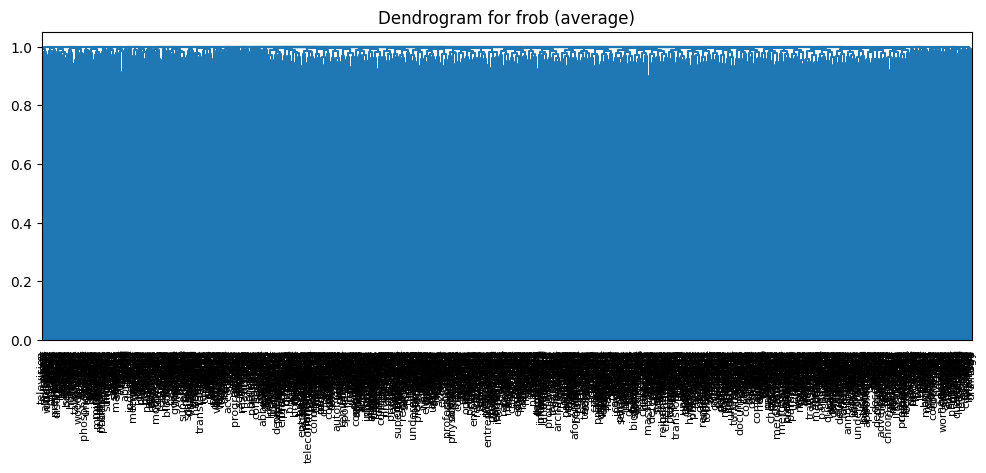

Saved cluster CSV to cluster_results/frob_clusters.csv

=== Processing ortsae ===


/Users/valeria/Desktop/NLA/project/.venv/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Number of clusters: 2434
Avg intra-cluster distance: 0.0000, max: 0.0000, min: 0.0000


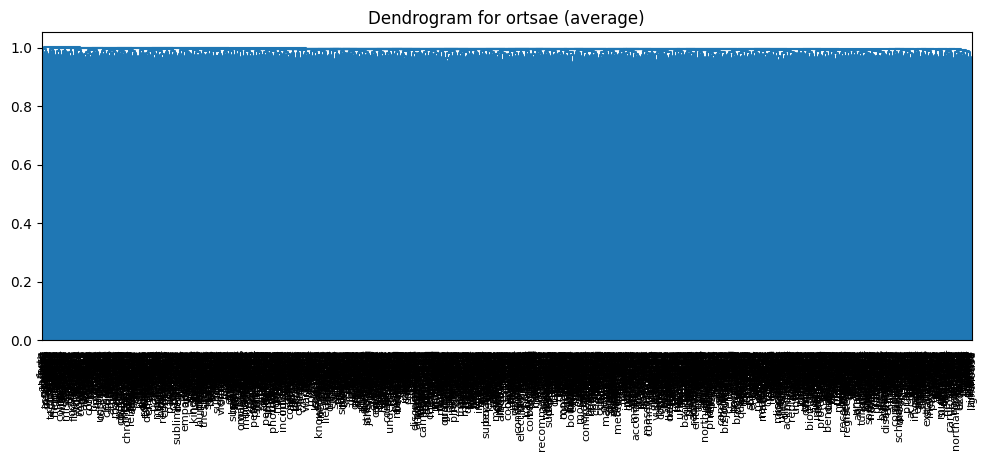

Saved cluster CSV to cluster_results/ortsae_clusters.csv

=== Processing noort ===


/Users/valeria/Desktop/NLA/project/.venv/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Number of clusters: 2641
Avg intra-cluster distance: 0.0000, max: 0.0000, min: 0.0000


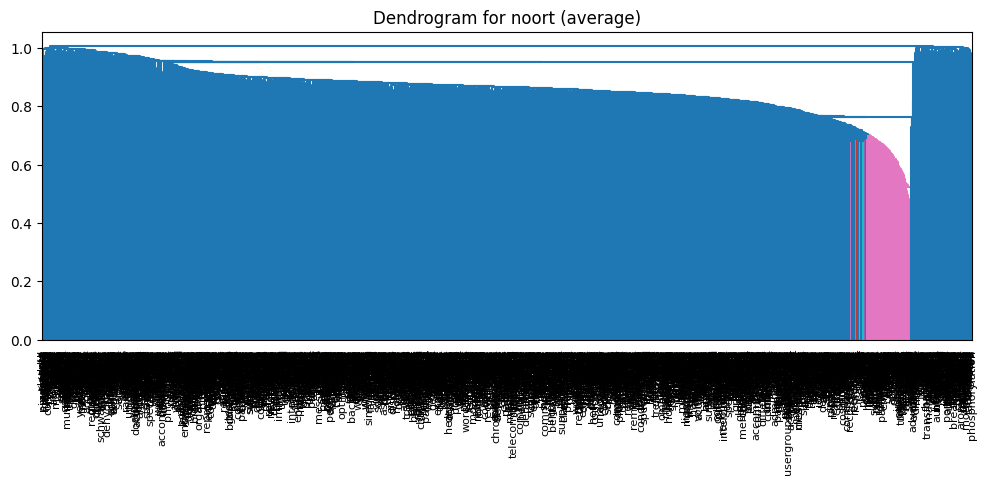

Saved cluster CSV to cluster_results/noort_clusters.csv

=== Processing srip ===


/Users/valeria/Desktop/NLA/project/.venv/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Number of clusters: 2549
Avg intra-cluster distance: 0.0000, max: 0.0000, min: 0.0000


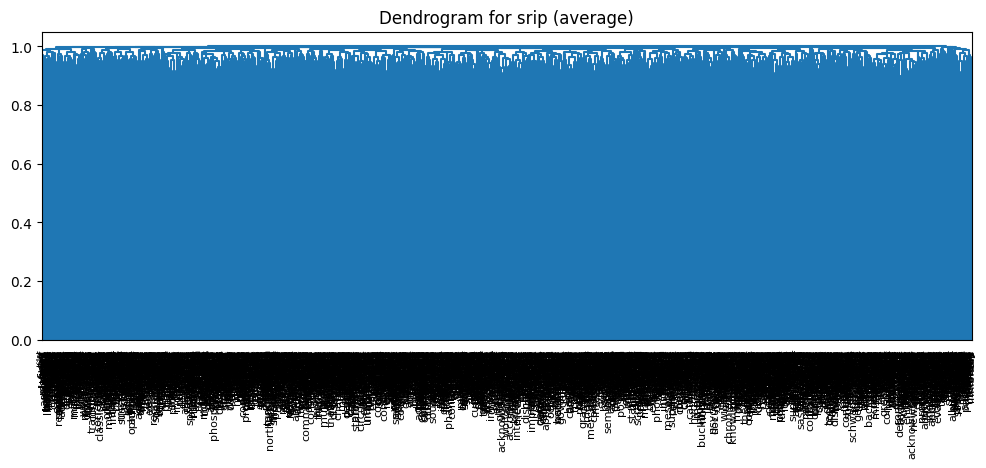

Saved cluster CSV to cluster_results/srip_clusters.csv


{'frob': {'W_norm': array([[ 0.0160277 , -0.01451658,  0.04189132, ..., -0.0409525 ,
           0.00482485,  0.00643582],
         [-0.05635145,  0.01394673, -0.02912676, ...,  0.00790653,
           0.00779875, -0.00619007],
         [-0.04130024,  0.04156652, -0.03416721, ..., -0.05251028,
          -0.01309085,  0.031205  ],
         ...,
         [-0.01737201, -0.02887368,  0.01795437, ..., -0.02303619,
          -0.02943981,  0.00241895],
         [ 0.01196885, -0.02725578,  0.04516757, ..., -0.01100293,
           0.01788372,  0.09782571],
         [ 0.01219531,  0.02326028,  0.0527904 , ..., -0.02582571,
           0.00748961,  0.0053018 ]], shape=(1726, 1024), dtype=float32),
  'embedding_2d': array([[ 1.2753296 ,  4.5505285 ],
         [ 6.823365  ,  4.494219  ],
         [-0.07978182,  3.7359536 ],
         ...,
         [ 2.5092916 ,  3.2189026 ],
         [ 9.764752  ,  4.799775  ],
         [ 3.1792054 ,  2.2602563 ]], shape=(1726, 2), dtype=float32),
  'cluster_labels': a

In [9]:
visualize_concept_embeddings_full(dict_usual, linkage_method='average', metric='cosine', distance_threshold=0.2)



=== Processing frob ===


/Users/valeria/Desktop/NLA/project/.venv/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Number of clusters: 1761
Avg intra-cluster distance: 0.0000, max: 0.0000, min: 0.0000


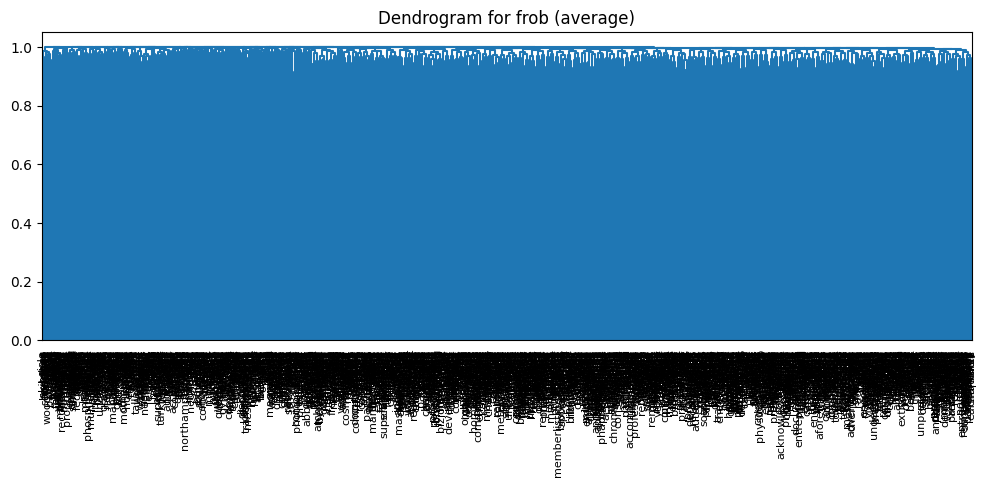

Saved cluster CSV to cluster_results/frob_clusters.csv

=== Processing ortsae ===


/Users/valeria/Desktop/NLA/project/.venv/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Number of clusters: 2193
Avg intra-cluster distance: 0.0000, max: 0.0000, min: 0.0000


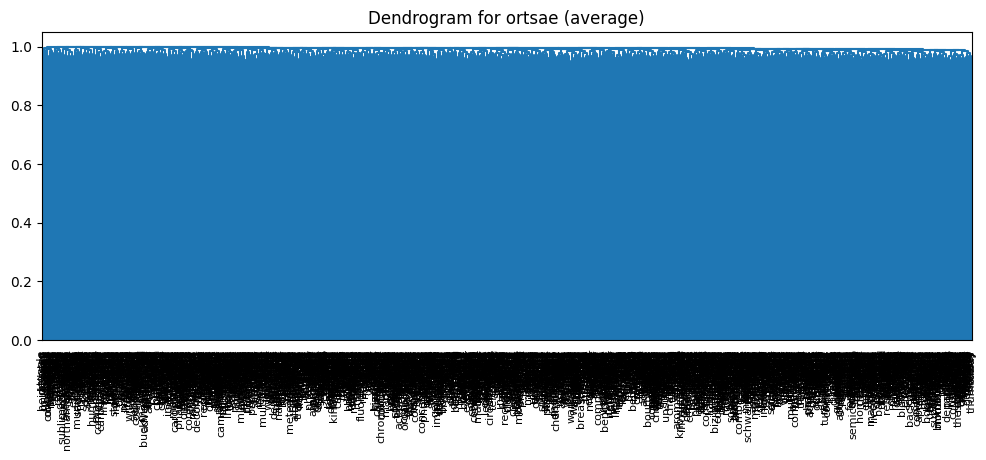

Saved cluster CSV to cluster_results/ortsae_clusters.csv

=== Processing noort ===


/Users/valeria/Desktop/NLA/project/.venv/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Number of clusters: 2016
Avg intra-cluster distance: 0.0000, max: 0.0000, min: 0.0000


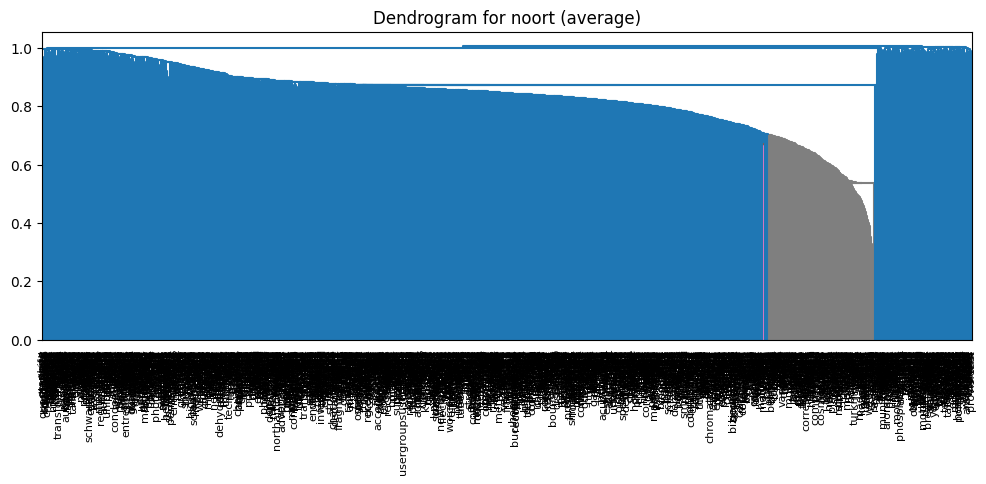

Saved cluster CSV to cluster_results/noort_clusters.csv

=== Processing srip ===


/Users/valeria/Desktop/NLA/project/.venv/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



Number of clusters: 2488
Avg intra-cluster distance: 0.0000, max: 0.0000, min: 0.0000


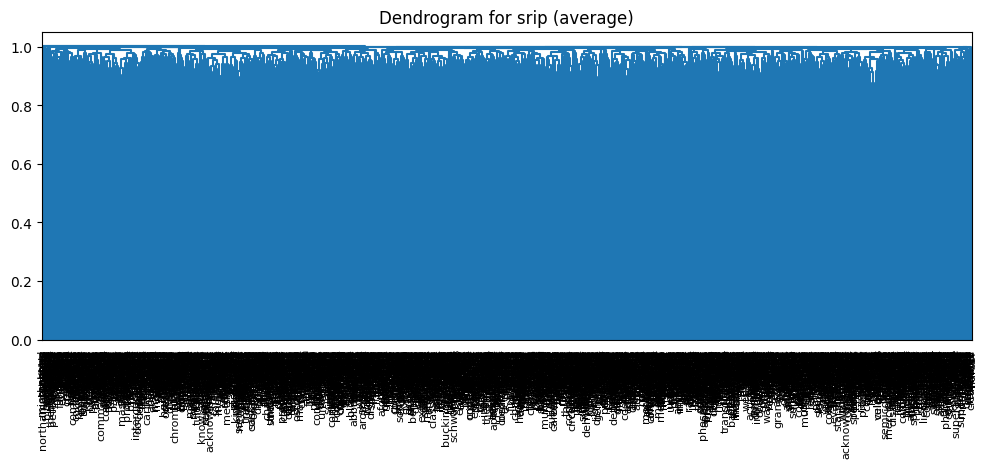

Saved cluster CSV to cluster_results/srip_clusters.csv


{'frob': {'W_norm': array([[ 0.01419701, -0.00067028,  0.02538422, ..., -0.01964318,
           0.01957944, -0.01309267],
         [-0.05635145,  0.01394673, -0.02912676, ...,  0.00790653,
           0.00779875, -0.00619007],
         [-0.03384753,  0.02897947,  0.00874209, ..., -0.03098832,
          -0.02208624,  0.01408831],
         ...,
         [ 0.01309441, -0.0304584 ,  0.03627893, ...,  0.00894401,
          -0.00792367,  0.0197104 ],
         [ 0.01196885, -0.02725578,  0.04516757, ..., -0.01100293,
           0.01788372,  0.09782571],
         [-0.0470266 , -0.01838227,  0.01534611, ..., -0.02010383,
           0.02197206,  0.01436542]], shape=(1761, 1024), dtype=float32),
  'embedding_2d': array([[2.1392171 , 3.462007  ],
         [6.442542  , 1.9411635 ],
         [0.10934772, 3.7659805 ],
         ...,
         [1.8316677 , 2.133252  ],
         [9.410493  , 2.0566225 ],
         [0.58249074, 3.6486862 ]], shape=(1761, 2), dtype=float32),
  'cluster_labels': array([1730, 

In [10]:
visualize_concept_embeddings_full(dict_no_norm, linkage_method='average', metric='cosine', distance_threshold=0.2)


In [57]:
import numpy as np
from collections import defaultdict
from scipy.cluster.hierarchy import linkage, fcluster
import pandas as pd
import plotly.figure_factory as ff

def average_by_name(embeddings, names):
    groups = defaultdict(list)
    for i, name in enumerate(names):
        groups[name].append(i)
    avg_embeds = []
    avg_names = []
    for name, idxs in groups.items():
        vec = embeddings[:, idxs].mean(axis=1)
        avg_embeds.append(vec)
        avg_names.append(name)
    return np.stack(avg_embeds, axis=1), avg_names

def plot_interactive_dendrograms(dict_sim, distance_threshold=None, save_clusters=False, output_dir="."):
    """
    Для каждой модели строит интерактивную дендрограмму Plotly с hover-именами
    и при необходимости сохраняет текстовые файлы с концептами по кластерам.

    dict_sim: dict, ключ = название модели, значение = [names, W (dim x n_concepts)]
    distance_threshold: float, на каком расстоянии отрезать дендрограмму для кластеров
    save_clusters: bool, если True сохраняет CSV с концептами по кластерам
    output_dir: папка для сохранения файлов
    """
    import os
    import torch
    
    for key, (names, W) in dict_sim.items():
        W_np = W.numpy() if isinstance(W, torch.Tensor) else W
        W_avg, names_avg = average_by_name(W_np, names)
        W_avg_T = W_avg.T  # [n_vectors, dim]

        # Linkage
        linkage_matrix = linkage(W_avg_T, method='ward')

        # --- Дендрограмма Plotly ---
        fig = ff.create_dendrogram(W_avg_T, orientation='bottom', labels=names_avg, linkagefun=lambda x: linkage_matrix)
        fig.update_layout(width=1200, height=400, title=f"Interactive dendrogram ({key})")
        fig.show()

        # --- Кластеры по порогу ---
        if distance_threshold is not None:
            cluster_labels = fcluster(linkage_matrix, t=distance_threshold, criterion='distance')
            
            if save_clusters:
                df_clusters = pd.DataFrame(columns=np.unique(cluster_labels))
                max_cluster_size = np.max(np.bincount(cluster_labels)[1:])  # ignore zero index
                for cluster_id in np.unique(cluster_labels):
                    words_in_cluster = [names_avg[i] for i, c in enumerate(cluster_labels) if c == cluster_id]
                    df_clusters.loc[0:len(words_in_cluster)-1, cluster_id] = words_in_cluster
                os.makedirs(output_dir, exist_ok=True)
                file_path = os.path.join(output_dir, f"{key}_clusters.csv")
                df_clusters.to_csv(file_path, index=False)
                print(f"Saved clusters for {key} -> {file_path}")


In [46]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage
import seaborn as sns
import matplotlib.pyplot as plt

def plot_concept_clustermaps(dict_sim, metric='cosine', method='average', figsize=(10,10), cmap='viridis'):
    """
    Для каждой модели из dict_sim строит clustermap по косинусной близости между концептами.
    
    dict_sim: dict, ключ = название модели, значение = [names, W]
    metric: метрика для pdist ('cosine' или любая поддерживаемая)
    method: linkage method для иерархической кластеризации ('average', 'complete', etc)
    figsize: размер фигуры
    cmap: цветовая карта для heatmap
    """
    results = {}
    
    for key, (names, W) in dict_sim.items():
        # --- проверка размеров ---
        if len(names) != W.shape[1]:
            raise ValueError(f"For model {key}: length of names ({len(names)}) "
                             f"does not match number of embeddings ({W.shape[1]})")
        
        # Косинусная дистанция между колонками W
        distances = pdist(W.T, metric=metric)
        similarity_matrix = 1 - squareform(distances)
        
        # DataFrame для seaborn
        df = pd.DataFrame(similarity_matrix, index=names, columns=names)
        
        # Linkage для clustermap
        linkage_matrix = linkage(distances, method=method)
        
        # Plot
        sns.set(font_scale=0.8)
        g = sns.clustermap(
            df,
            row_linkage=linkage_matrix,
            col_linkage=linkage_matrix,
            figsize=figsize,
            cmap=cmap,
            vmin=0.0,
            vmax=1.0
        )
        plt.title(f"Clustermap of concept embeddings ({key})")
        plt.show()
        
        results[key] = g
    
    return results


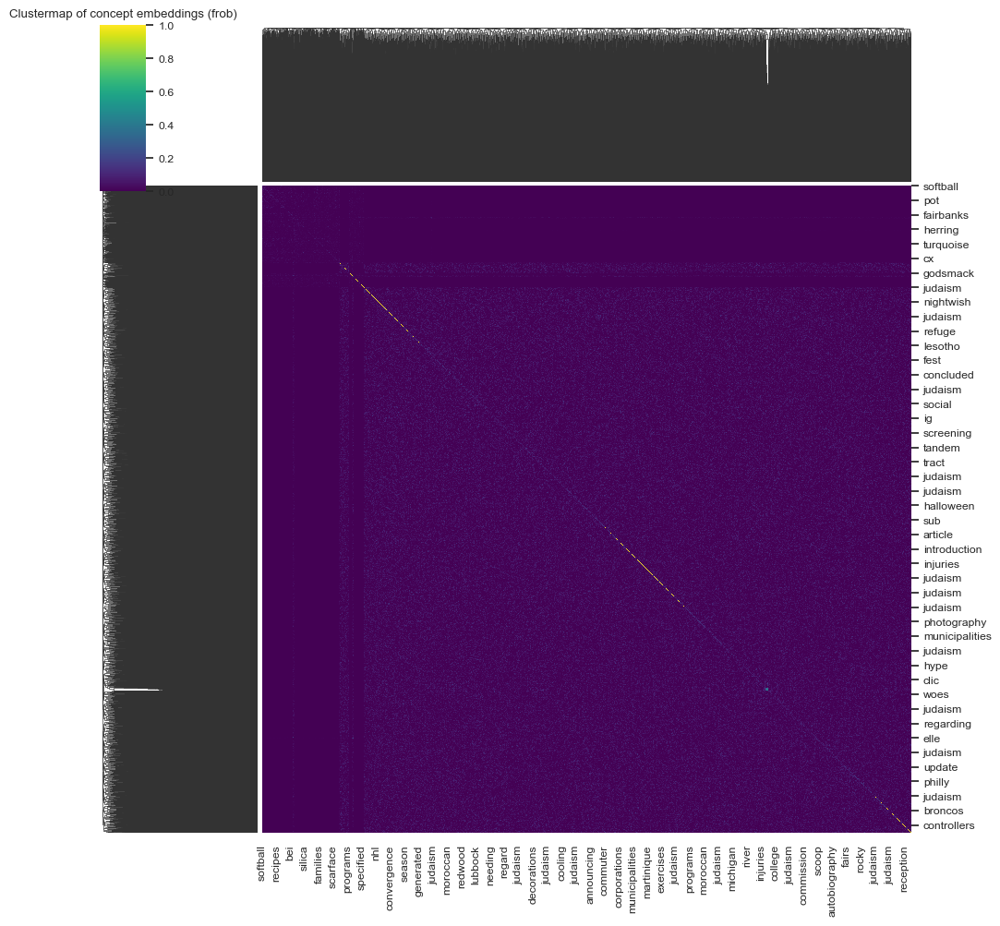

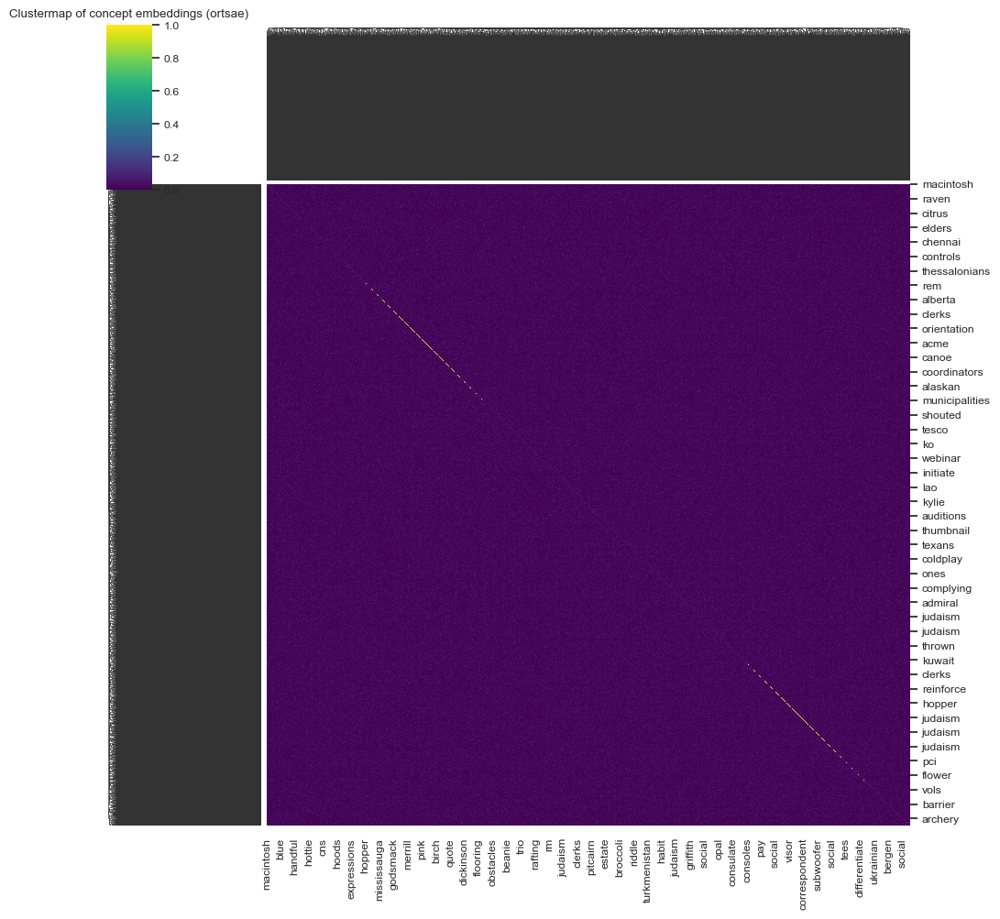

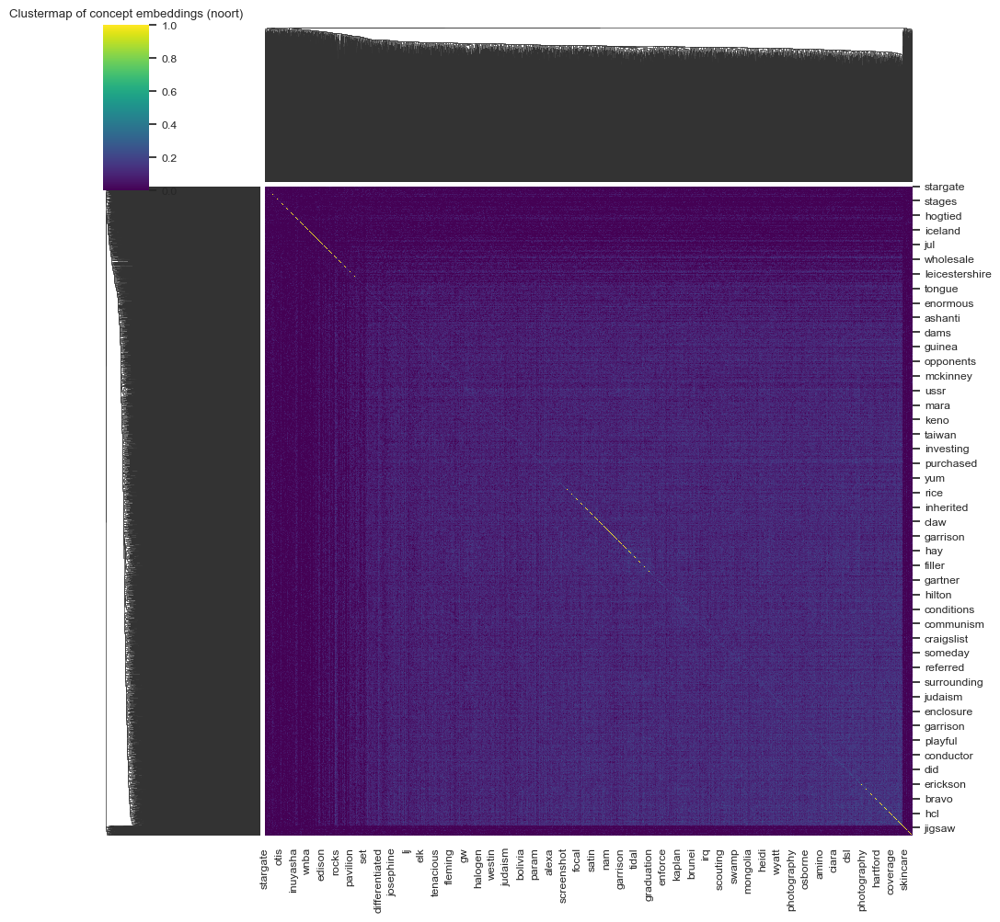

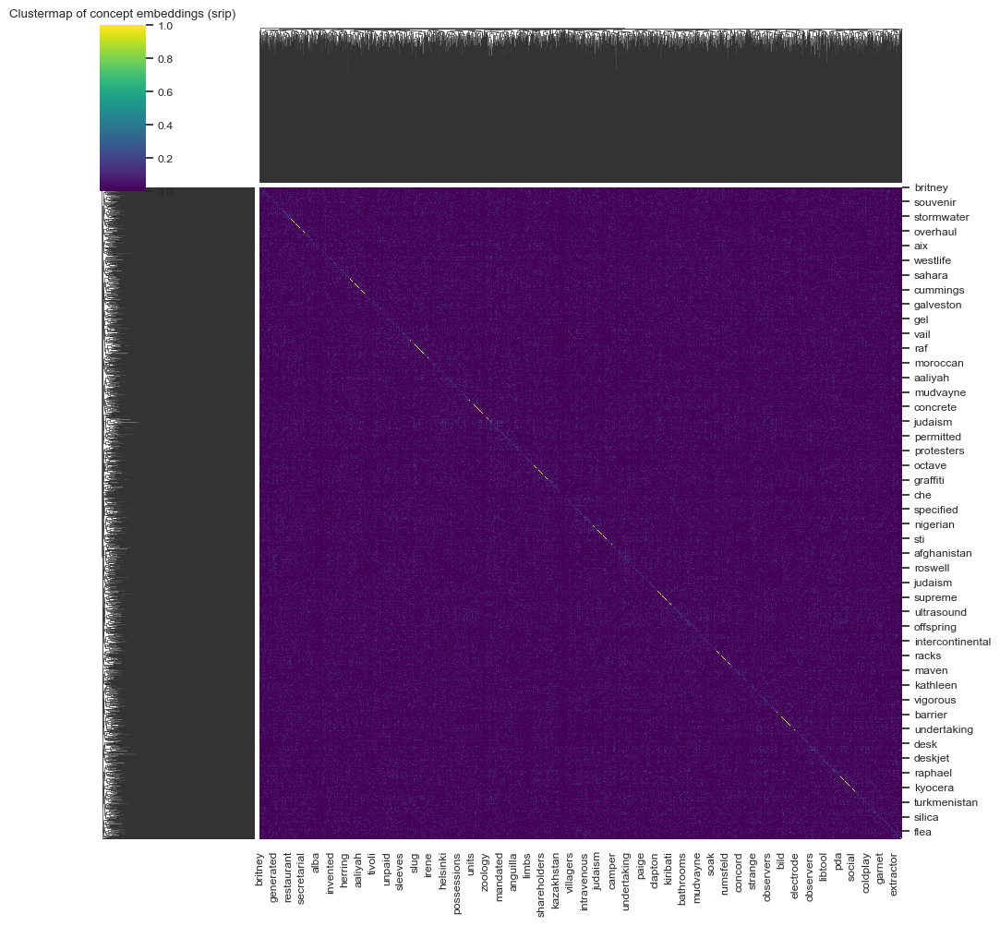

In [47]:
clustermap_results = plot_concept_clustermaps(dict_usual, metric='cosine', method='average')


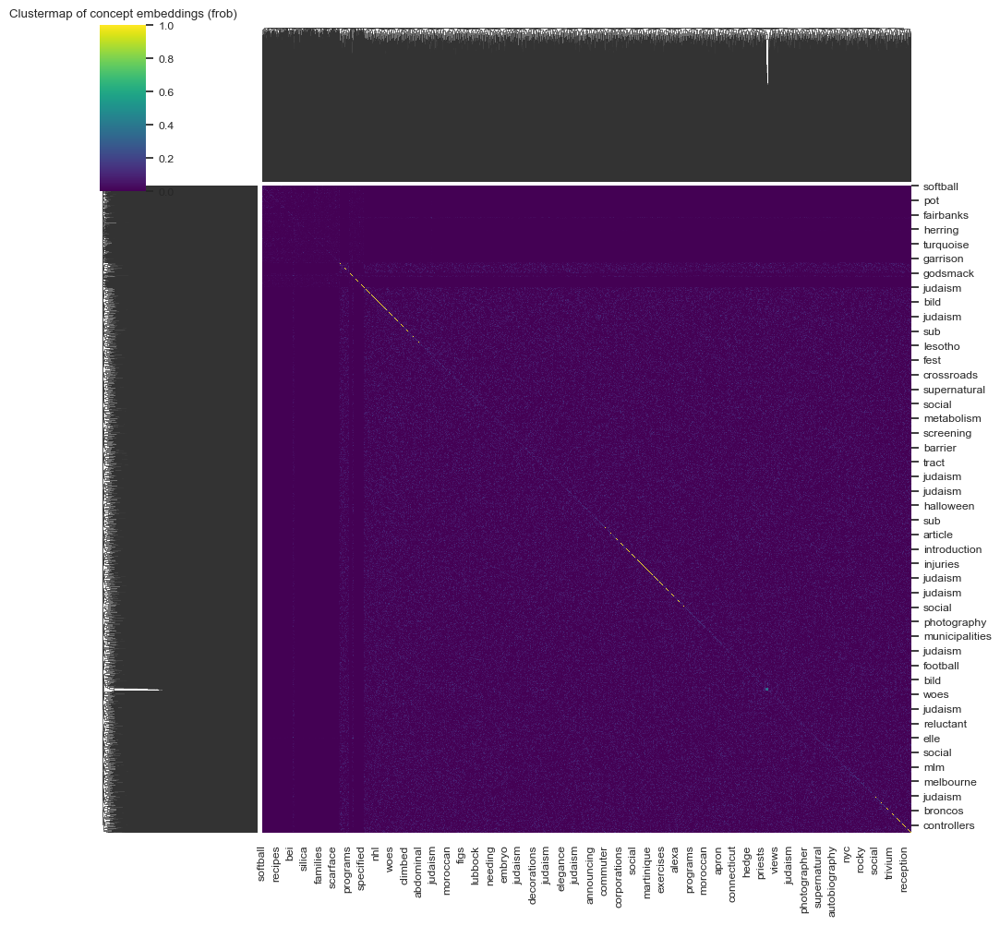

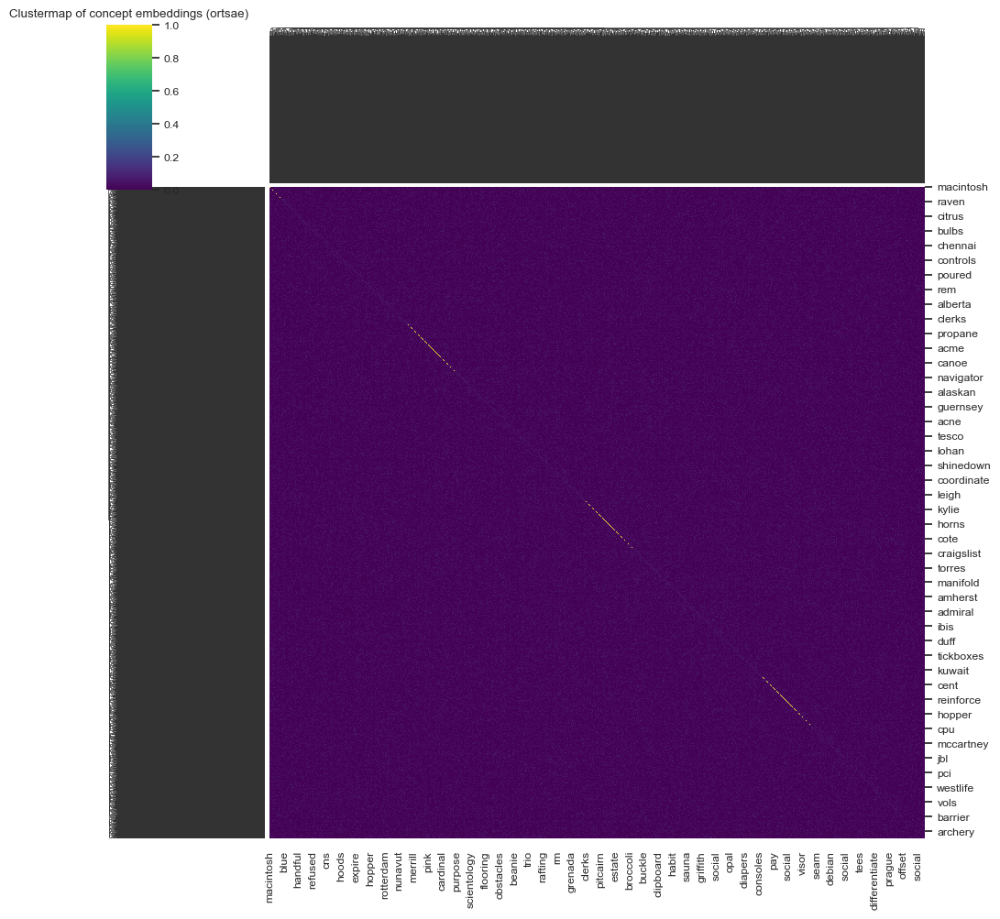

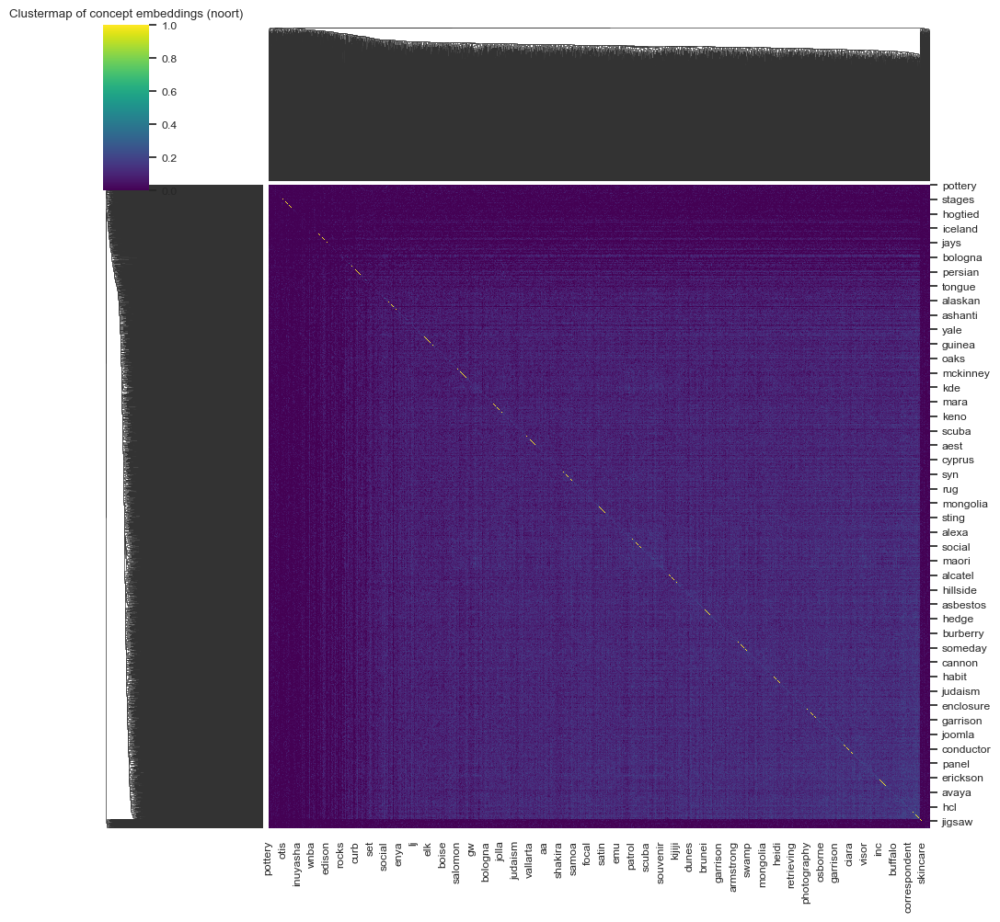

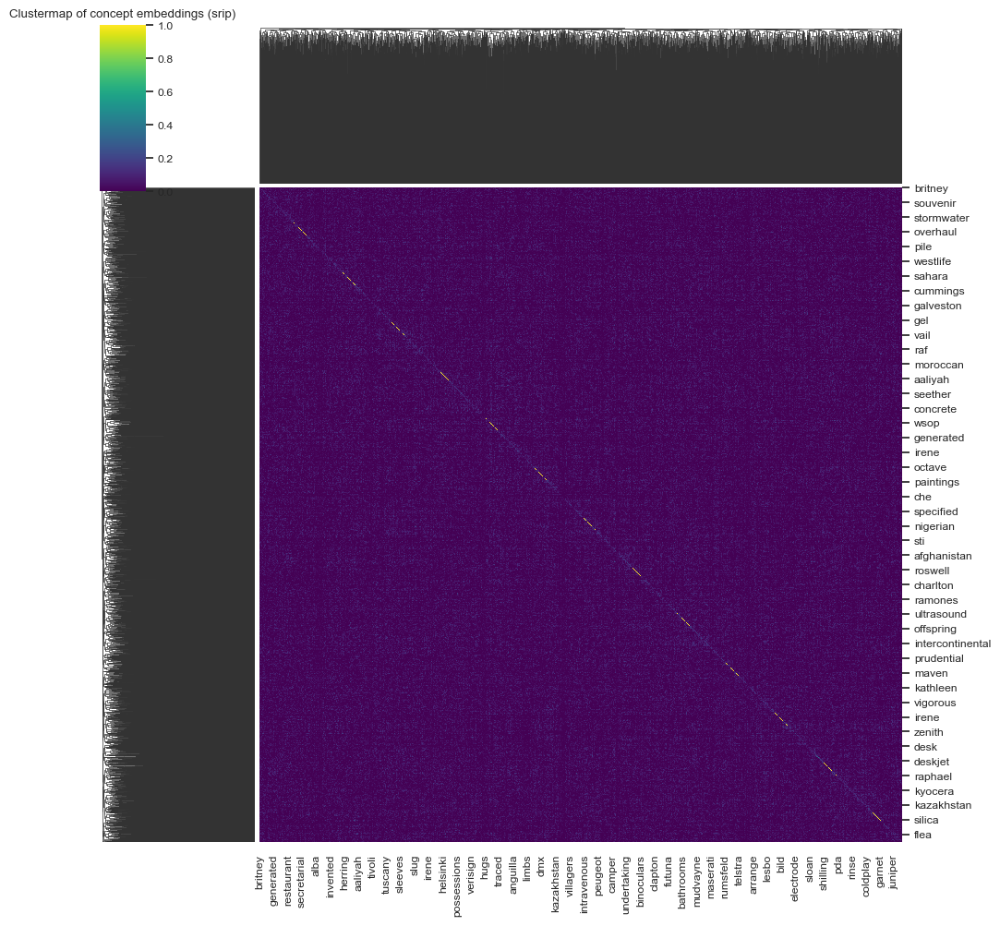

In [48]:
clustermap_results_no_norm = plot_concept_clustermaps(dict_no_norm, metric='cosine', method='average')

In [29]:
import numpy as np
import matplotlib.pyplot as plt
import torch

def graph_sparsity_vs_threshold(dict_sim):
    """
    Для каждой модели из dict_sim строит график разреженности vs порог косинусной похожести.
    Разреженность = 1 - fraction of edges.
    Пороги: 0.5, 0.6, ..., 0.9
    Выводит численные значения разреженности для каждого порога.
    """
    thresholds = np.arange(0.5, 1.0, 0.1)  # каждые 0.1
    plt.figure(figsize=(8,6))
    
    for key, (names, W) in dict_sim.items():
        W_np = W.numpy() if isinstance(W, torch.Tensor) else W
        norms = np.linalg.norm(W_np, axis=0)
        G = (W_np.T @ W_np) / (norms[None,:] * norms[:,None])
        np.fill_diagonal(G, 0)
        
        n_concepts = W_np.shape[1]
        sparsities = []
        for t in thresholds:
            adj = (G >= t).astype(int)
            edges = np.sum(adj)//2
            sparsity = 1 - edges / (n_concepts*(n_concepts-1)/2)
            sparsities.append(sparsity)
        
        # --- Вывод чисел для каждого порога ---
        print(f"\nModel: {key}")
        for t, s in zip(thresholds, sparsities):
            print(f"  Threshold {t:.1f} -> sparsity {s:.4f}")
        print(f"  Mean sparsity: {np.mean(sparsities):.4f}, Max sparsity: {np.max(sparsities):.4f}")
        
        plt.plot(thresholds, sparsities, marker='o', label=key)
        print(key, sparsities)
    
    plt.xlabel("Cosine similarity threshold")
    plt.ylabel("Graph sparsity (fraction of missing edges)")
    plt.title("Graph sparsity vs cosine similarity threshold")
    plt.grid(True)
    plt.legend()
    plt.show()



Model: frob
  Threshold 0.5 -> sparsity 1.0000
  Threshold 0.6 -> sparsity 1.0000
  Threshold 0.7 -> sparsity 1.0000
  Threshold 0.8 -> sparsity 1.0000
  Threshold 0.9 -> sparsity 1.0000
  Mean sparsity: 1.0000, Max sparsity: 1.0000
frob [np.float64(0.9999998807615995), np.float64(0.9999998807615995), np.float64(1.0), np.float64(1.0), np.float64(1.0)]

Model: ortsae
  Threshold 0.5 -> sparsity 1.0000
  Threshold 0.6 -> sparsity 1.0000
  Threshold 0.7 -> sparsity 1.0000
  Threshold 0.8 -> sparsity 1.0000
  Threshold 0.9 -> sparsity 1.0000
  Mean sparsity: 1.0000, Max sparsity: 1.0000
ortsae [np.float64(1.0), np.float64(1.0), np.float64(1.0), np.float64(1.0), np.float64(1.0)]

Model: noort
  Threshold 0.5 -> sparsity 1.0000
  Threshold 0.6 -> sparsity 1.0000
  Threshold 0.7 -> sparsity 1.0000
  Threshold 0.8 -> sparsity 1.0000
  Threshold 0.9 -> sparsity 1.0000
  Mean sparsity: 1.0000, Max sparsity: 1.0000
noort [np.float64(1.0), np.float64(1.0), np.float64(1.0), np.float64(1.0), np.flo

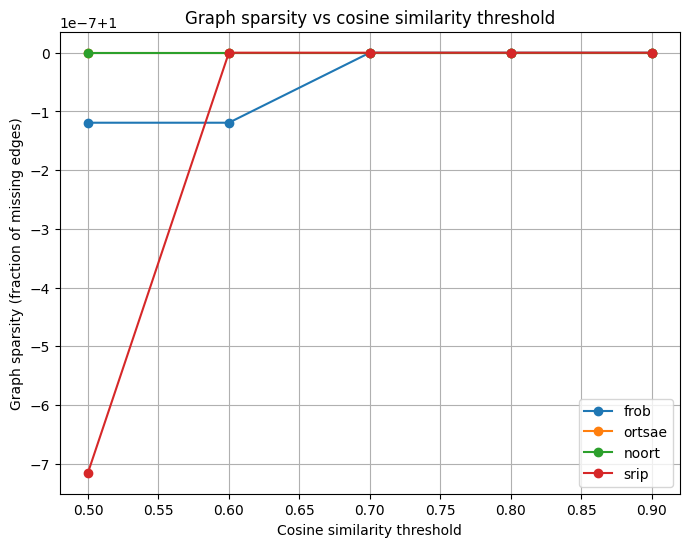

In [30]:
graph_sparsity_vs_threshold(dict_usual)


Model: frob
  Threshold 0.5 -> sparsity 1.0000
  Threshold 0.6 -> sparsity 1.0000
  Threshold 0.7 -> sparsity 1.0000
  Threshold 0.8 -> sparsity 1.0000
  Threshold 0.9 -> sparsity 1.0000
  Mean sparsity: 1.0000, Max sparsity: 1.0000

Model: ortsae
  Threshold 0.5 -> sparsity 1.0000
  Threshold 0.6 -> sparsity 1.0000
  Threshold 0.7 -> sparsity 1.0000
  Threshold 0.8 -> sparsity 1.0000
  Threshold 0.9 -> sparsity 1.0000
  Mean sparsity: 1.0000, Max sparsity: 1.0000

Model: noort
  Threshold 0.5 -> sparsity 1.0000
  Threshold 0.6 -> sparsity 1.0000
  Threshold 0.7 -> sparsity 1.0000
  Threshold 0.8 -> sparsity 1.0000
  Threshold 0.9 -> sparsity 1.0000
  Mean sparsity: 1.0000, Max sparsity: 1.0000

Model: srip
  Threshold 0.5 -> sparsity 1.0000
  Threshold 0.6 -> sparsity 1.0000
  Threshold 0.7 -> sparsity 1.0000
  Threshold 0.8 -> sparsity 1.0000
  Threshold 0.9 -> sparsity 1.0000
  Mean sparsity: 1.0000, Max sparsity: 1.0000


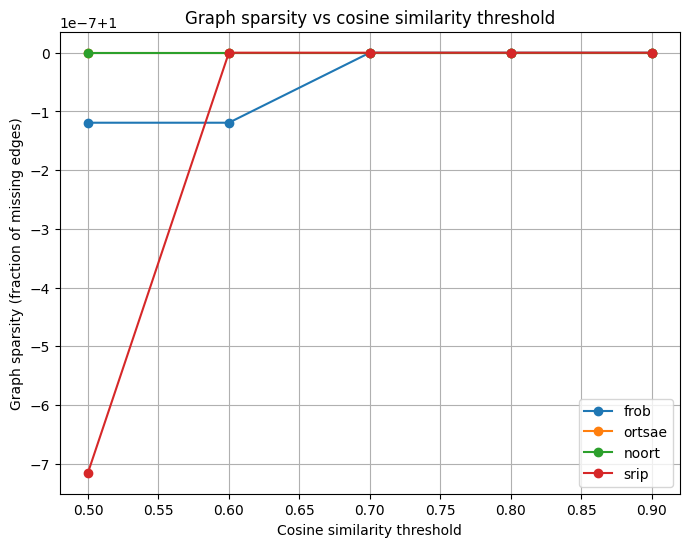

In [28]:
graph_sparsity_vs_threshold(dict_no_norm)

гистограмма 

--- frob ---
count    4096.000000
mean        0.072745
std         0.169091
min        -0.010505
25%         0.004439
50%         0.011670
75%         0.022697
max         1.229253
Name: similarity, dtype: float64

--- noort ---
count    4096.000000
mean        0.214301
std         0.550455
min         0.009192
25%         0.027973
50%         0.033947
75%         0.040866
max         4.095482
Name: similarity, dtype: float64

--- ortsae ---
count    4096.000000
mean        0.267909
std         0.719912
min         0.005493
25%         0.019634
50%         0.025996
75%         0.033353
max         4.834784
Name: similarity, dtype: float64

--- srip ---
count    4096.000000
mean        0.105916
std         0.208517
min         0.000524
25%         0.022683
50%         0.029507
75%         0.037866
max         1.692408
Name: similarity, dtype: float64



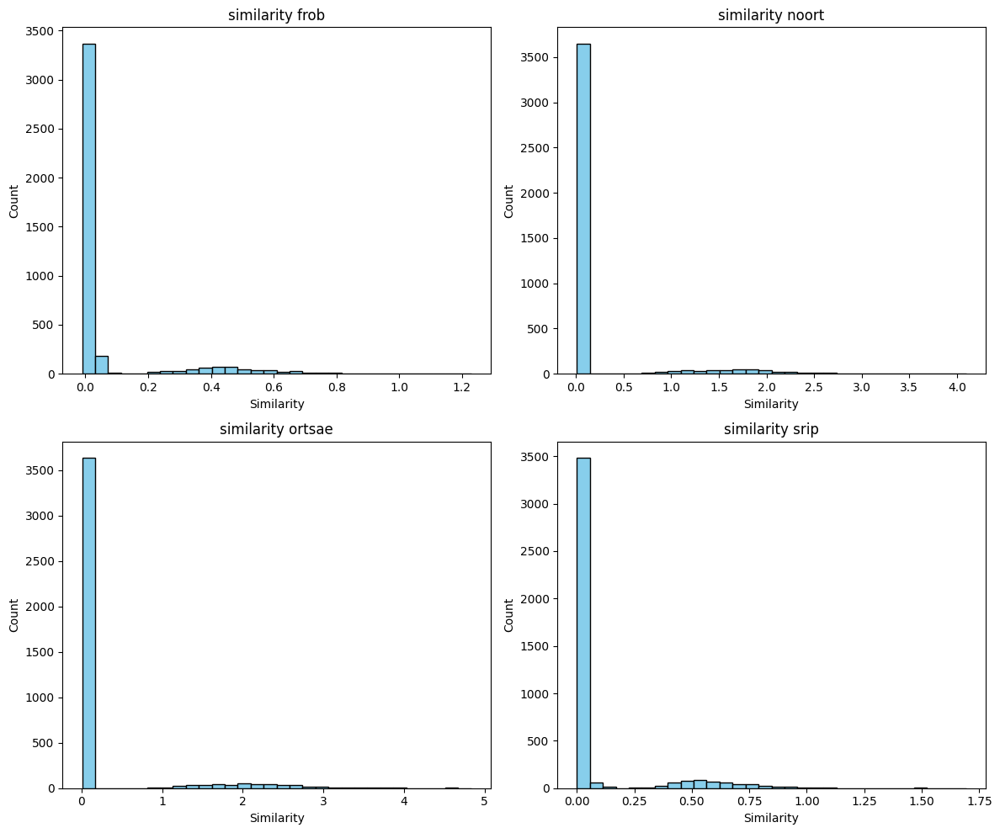

In [65]:
import pandas as pd
import matplotlib.pyplot as plt

# Загрузка данных
frob = pd.read_csv("concept_names_frob_sim.csv")
noort = pd.read_csv("concept_names_noort_sim.csv")
ortsae = pd.read_csv("concept_names_ortsae_sim.csv")
srip = pd.read_csv("concept_names_srip_sim.csv")

# Создаем фигуру и оси 2x2
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# Словарь для упрощения цикла
data_dict = {
    'frob': frob,
    'noort': noort,
    'ortsae': ortsae,
    'srip': srip
}

# Построение гистограмм и вывод статистики
for ax, (name, df) in zip(axes.flatten(), data_dict.items()):
    ax.hist(df['similarity'], bins=30, color='skyblue', edgecolor='black')
    ax.set_title(f"similarity {name}")
    ax.set_xlabel("Similarity")
    ax.set_ylabel("Count")
    
    # Вывод статистики
    stats = df['similarity'].describe()
    print(f"--- {name} ---")
    print(stats)
    print()

plt.tight_layout()
plt.show()


In [93]:
import pandas as pd

# Загрузка данных и удаление лишней колонки
frob = pd.read_csv("concept_names_frob_sim.csv").drop(columns=['Unnamed: 0'])
noort = pd.read_csv("concept_names_noort_sim.csv").drop(columns=['Unnamed: 0'])
ortsae = pd.read_csv("concept_names_ortsae_sim.csv").drop(columns=['Unnamed: 0'])
srip = pd.read_csv("concept_names_srip_sim.csv").drop(columns=['Unnamed: 0'])

data_dict = {
    'frob': frob,
    'noort': noort,
    'ortsae': ortsae,
    'srip': srip
}

top_dfs = []

for name, df in data_dict.items():
    # Считаем частоту слов в этом датафрейме
    freq = df['concept_name'].value_counts()
    
    # Берем топ-10 по similarity
    top_df = df.nlargest(10, 'similarity').copy()
    
    # Добавляем метод и частоту
    top_df['method'] = name
    top_df['count'] = top_df['concept_name'].map(freq)
    
    top_dfs.append(top_df)

# Объединяем все топы
clodf = pd.concat(top_dfs, ignore_index=True)

clodf


,concept_name,similarity,method,count
0,turquoise,1.229253,frob,1
1,burgundy,1.112456,frob,1
2,yellow,1.110966,frob,1
3,stripes,1.091368,frob,1
4,pink,1.090549,frob,1
5,purple,1.040469,frob,1
6,orange,1.020916,frob,1
7,red,0.996843,frob,3
8,white,0.939527,frob,1
9,lime,0.917426,frob,1
